<a href="https://colab.research.google.com/github/somilasthana/MachineLearningSkills/blob/master/Prediction_Using_NLP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.mosaicplot import mosaic
from scipy.stats import chi2_contingency

In [2]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

In [3]:
import warnings
warnings.filterwarnings('ignore')

In [4]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
from nltk.corpus import stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


####Library

In [5]:
def top_word_cnt(df,n,ngram_range=(1, 1), stop_word_list = list(stop_words)):
  cvectorizer = CountVectorizer(ngram_range=ngram_range, stop_words = stop_word_list)
  df_cnt = cvectorizer.fit_transform(df)
  vocab = cvectorizer.get_feature_names_out()
  m = np.array(df_cnt.sum(axis = 0)).flatten()
  if n<0:
    index = np.argsort(m)[n:]
  else:
    index = np.argsort(m)[:n]
  word_list = vocab[index]
  cnt_list = m[index]
  return pd.DataFrame(data = {"word": word_list, "cnt": cnt_list })


def top_word_tfidf(df,n,ngram_range=(1, 1), stop_word_list = list(stop_words)):
  cvectorizer = TfidfVectorizer(ngram_range=ngram_range, stop_words = stop_word_list)
  df_cnt = cvectorizer.fit_transform(df)
  vocab = cvectorizer.get_feature_names_out()
  m = np.array(df_cnt.mean(axis = 0)).flatten()
  if n<0:
    index = np.argsort(m)[n:]
  else:
    index = np.argsort(m)[:n]
  word_list = vocab[index]
  cnt_list = m[index]
  return pd.DataFrame(data = {"word": word_list, "cnt": cnt_list })


def pmi(df, n=11,ngram_range=(1, 1), stop_word_list = list(stop_words)):
  '''
    Calculate the positive pointwise mutal information score for each entry
    https://en.wikipedia.org/wiki/Pointwise_mutual_information
    We use the log( p(y|x)/p(y) ), y being the column, x being the row
  '''
  # Get numpy array from pandas df
  cvectorizer = CountVectorizer(ngram_range=ngram_range, stop_words = stop_word_list)
  X = cvectorizer.fit_transform(df)
  vocab = cvectorizer.get_feature_names_out()
  arr = (X.T * X) # this is co-occurrence matrix in sparse csr format
  arr.setdiag(0) # sometimes you want to fill same word cooccurence to 0
  arr = arr.todense()

  # p(y|x) probability of each t1 overlap within the row
  row_totals = arr.sum(axis=1).astype(float)
  prob_cols_given_row = (arr.T / row_totals).T

  # p(y) probability of each t1 in the total set
  col_totals = arr.sum(axis=0).astype(float)
  prob_of_cols = col_totals / sum(col_totals)

  # PMI: log( p(y|x) / p(y) )
  # This is the same data, normalized
  ratio = prob_cols_given_row / prob_of_cols
  #ratio[ratio==0] = 0.00001
  _pmi = np.log1p(ratio)
  _pmi[_pmi < 0] = 0

  _pmi_info = np.asarray(_pmi)
  ii = np.unravel_index(np.argsort(_pmi_info.ravel())[-1*n:], _pmi_info.shape)

  return _pmi_info,vocab

from sklearn import metrics
def auc_metric(classifer, X_test_feature_set, y_test):
  y_pred_proba = classifer.predict_proba(X_test_feature_set)[::,1]
  auc = metrics.roc_auc_score(y_test, y_pred_proba)
  return auc

####Data Loading / Data Processing / EDA

In [6]:
import csv

In [9]:
blurb = []
state = []
created_at = []
with open('/content/kickstarter.csv', newline='') as csvfile:
  kickstarter_reader = csv.reader(csvfile, delimiter=',', quotechar='"')
  for row in kickstarter_reader:
    blurb.append(row[0])
    state.append(row[1])
    created_at.append(row[2])

In [10]:
kickstarter_data = pd.DataFrame(data = {"blurb": blurb, "state": state, "created_at": created_at})
kickstarter_data = kickstarter_data.drop([0])
kickstarter_data["state"] = kickstarter_data["state"].astype(int)

In [11]:
kickstarter_data.head()

,blurb,state,created_at
1,Exploring paint and its place in a digital world.,0,2015-03-17
2,Mike Fassio wants a side-by-side photo of me a...,0,2014-07-11
3,I need your help to get a nice graphics tablet...,0,2014-07-30
4,I want to create a Nature Photograph Series of...,0,2015-05-08
5,I want to bring colour to the world in my own ...,0,2015-02-01


In [12]:
"Number of campaign", len(kickstarter_data)

('Number of campaign', 269790)

In [13]:
kickstarter_data.state.value_counts()

0    141159
1    128631
Name: state, dtype: int64

#####Step 1: Data Exploration

In [ ]:
import string

kickstarter_data["campaign_text_length"] = kickstarter_data["blurb"].apply(lambda x: len(x))
kickstarter_data["campaign_word_length"] = kickstarter_data["blurb"].apply(lambda x: len(x.split(" ")))
kickstarter_data["num_blurb_punctuation"] = kickstarter_data["blurb"].apply(lambda x: sum([1 for w in x if w in string.punctuation.replace(".","")]))
kickstarter_data["lowercampaign_text"] = kickstarter_data["blurb"].apply(lambda x: x.lower().translate(str.maketrans('', '', string.punctuation)))

kickstarter_data["num_one_word_length"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if len(w) == 1]))
kickstarter_data["num_two_word_length"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if len(w) == 2]))
kickstarter_data["num_three_word_length"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if len(w) == 3]))
kickstarter_data["num_four_word_length"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if len(w) == 4]))

kickstarter_data["num_stop_word"] = kickstarter_data["lowercampaign_text"].apply(lambda x: sum([1 for w in x.split(" ") if w in stop_words]))

In [ ]:
kickstarter_data.head()

,blurb,state,created_at,campaign_text_length,campaign_word_length,num_blurb_punctuation,lowercampaign_text,num_one_word_length,num_two_word_length,num_three_word_length,num_four_word_length,num_stop_word
1,Exploring paint and its place in a digital world.,0,2015-03-17,49,9,0,exploring paint and its place in a digital world,1,1,2,0,4
2,Mike Fassio wants a side-by-side photo of me a...,0,2014-07-11,115,22,4,mike fassio wants a sidebyside photo of me and...,2,2,2,7,8
3,I need your help to get a nice graphics tablet...,0,2014-07-30,61,12,1,i need your help to get a nice graphics tablet...,2,1,2,4,5
4,I want to create a Nature Photograph Series of...,0,2015-05-08,102,17,0,i want to create a nature photograph series of...,2,4,1,1,7
5,I want to bring colour to the world in my own ...,0,2015-02-01,132,26,0,i want to bring colour to the world in my own ...,1,7,4,3,12


#####1.1 Text Length Distribution

<Axes: xlabel='campaign_text_length', ylabel='Density'>

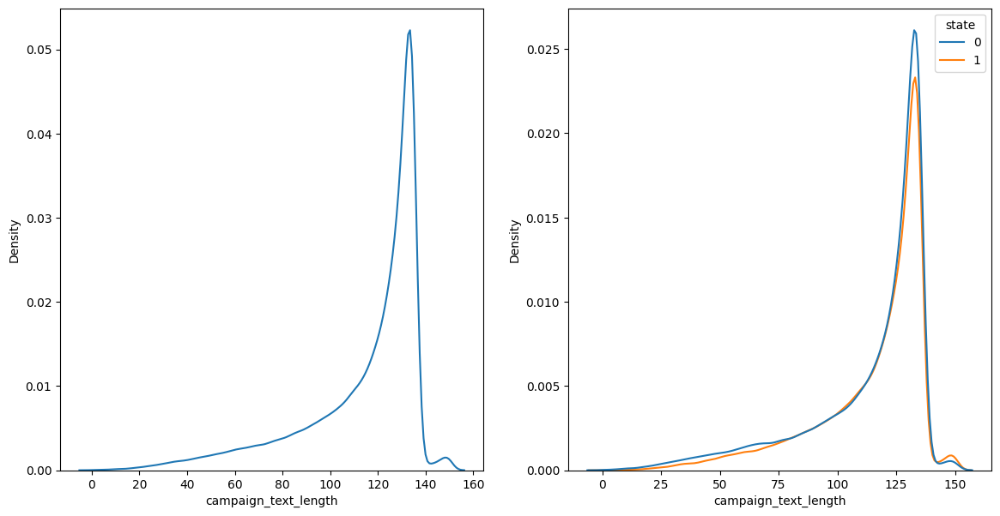

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data, x="campaign_text_length", ax = axs[0])
sns.kdeplot(data=kickstarter_data, x="campaign_text_length", hue= "state", ax = axs[1])

#####1.2 Word Length Distribution

<Axes: xlabel='campaign_word_length', ylabel='Density'>

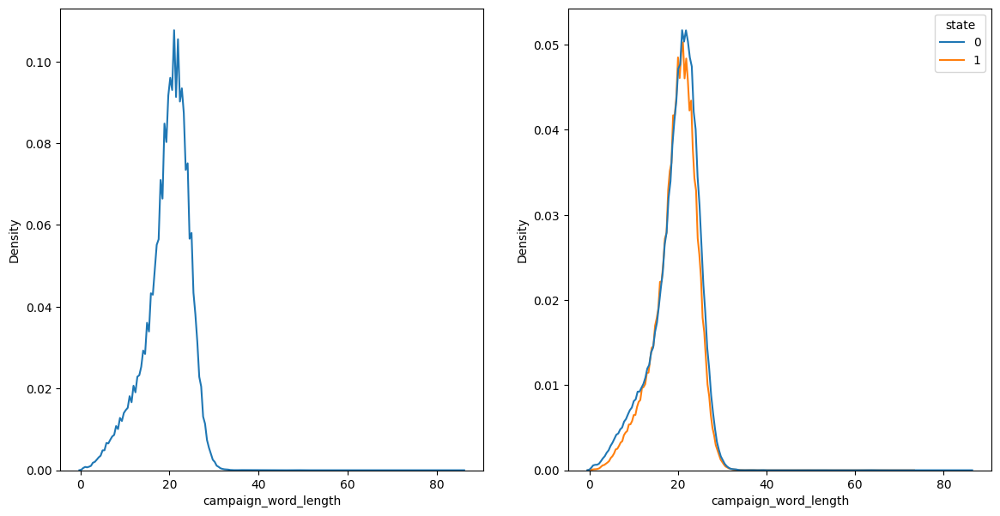

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data, x="campaign_word_length", ax = axs[0])
sns.kdeplot(data=kickstarter_data, x="campaign_word_length", hue= "state", ax = axs[1])

#####1.3 Number of Punctuation  Distribution

Text(0.5, 1.0, 'Successful Campaign Punctuation Distribution')

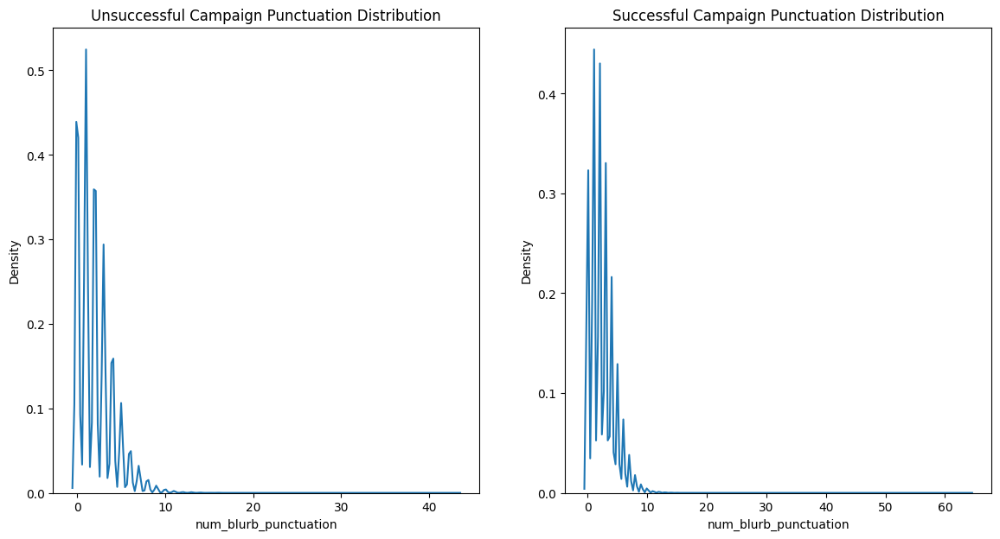

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 0], x="num_blurb_punctuation", ax = axs[0])
axs[0].set_title("Unsuccessful Campaign Punctuation Distribution")
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 1], x="num_blurb_punctuation", ax = axs[1])
axs[1].set_title("Successful Campaign Punctuation Distribution")

#####1.3 Number of Word of Length 1 Distribution (e.g. 'a', 'I')


Text(0.5, 1.0, 'Successful Campaign One Word Len Distribution')

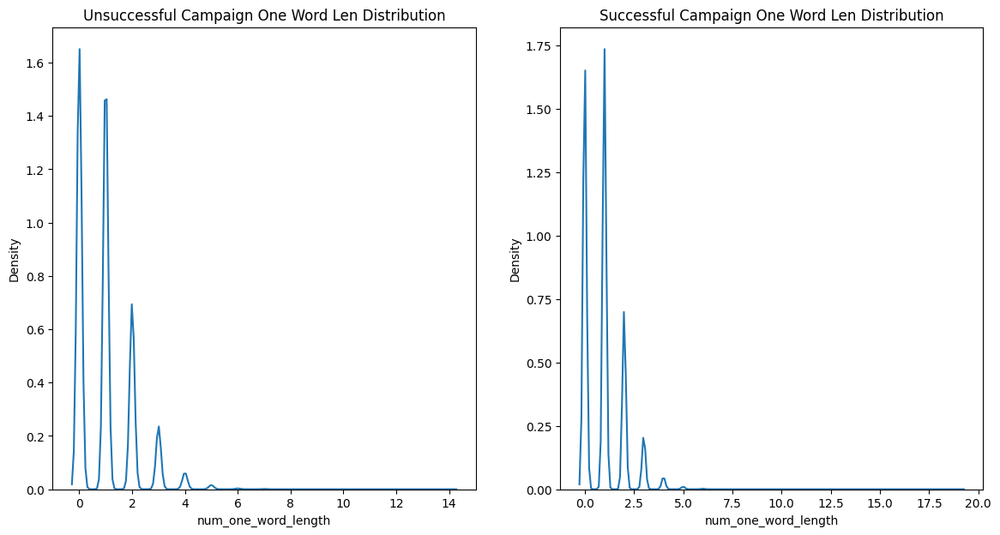

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 0], x="num_one_word_length", ax = axs[0])
axs[0].set_title("Unsuccessful Campaign One Word Len Distribution")
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 1], x="num_one_word_length", ax = axs[1])
axs[1].set_title("Successful Campaign One Word Len Distribution")

#####1.4 Number of Word of Length 2 Distribution (e.g. 'am', 'in')

Text(0.5, 1.0, 'Successful Campaign Two Word Len Distribution')

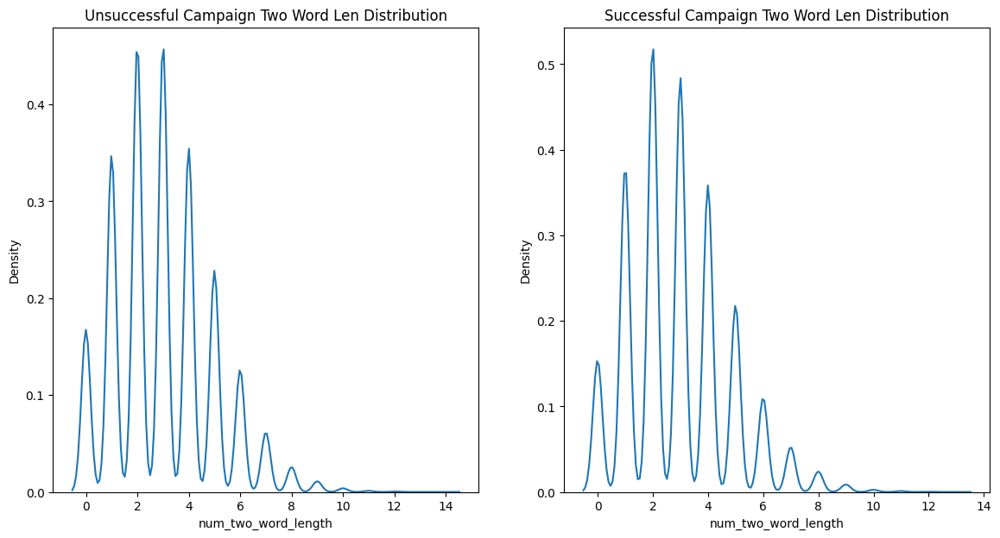

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 0], x="num_two_word_length", ax = axs[0])
axs[0].set_title("Unsuccessful Campaign Two Word Len Distribution")
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 1], x="num_two_word_length", ax = axs[1])
axs[1].set_title("Successful Campaign Two Word Len Distribution")

#####1.5 Number of Word of Length 3 Distribution (e.g. 'and', 'pay')

Text(0.5, 1.0, 'Successful Campaign Three Word Len Distribution')

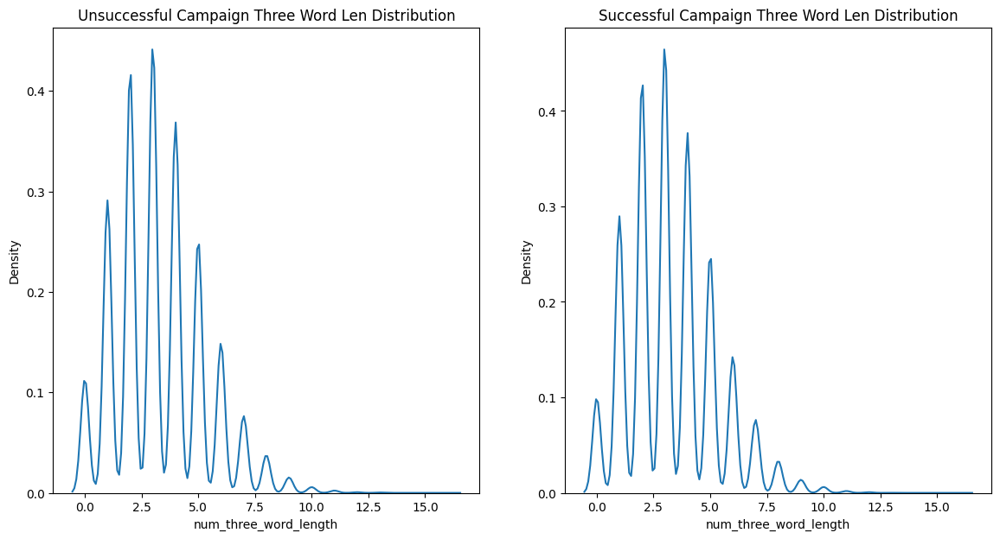

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 0], x="num_three_word_length", ax = axs[0])
axs[0].set_title("Unsuccessful Campaign Three Word Len Distribution")
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 1], x="num_three_word_length", ax = axs[1])
axs[1].set_title("Successful Campaign Three Word Len Distribution")

#####1.6 Number of Word of Length 4 Distribution (e.g. 'fund', 'part')

Text(0.5, 1.0, 'Successful Campaign Four Word Len Distribution')

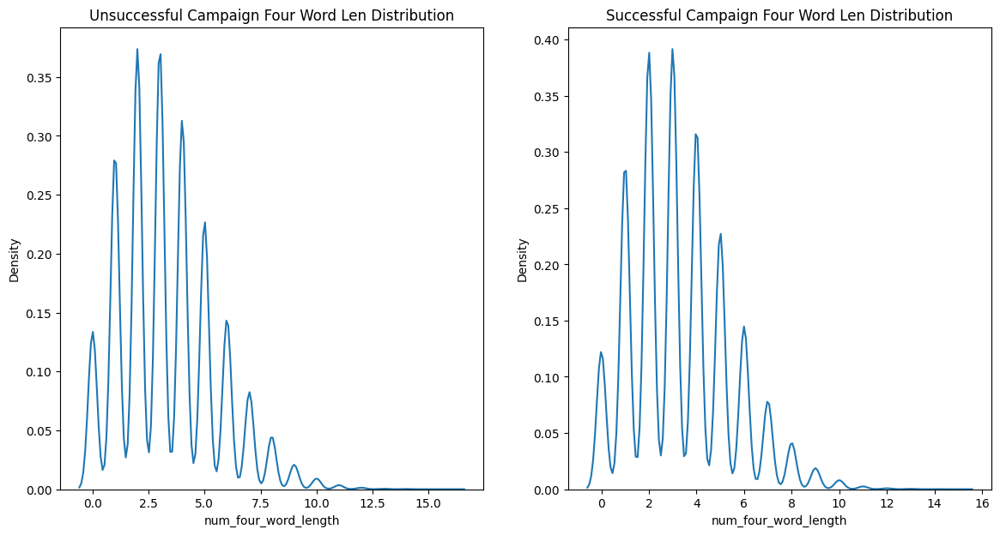

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 0], x="num_four_word_length", ax = axs[0])
axs[0].set_title("Unsuccessful Campaign Four Word Len Distribution")
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 1], x="num_four_word_length", ax = axs[1])
axs[1].set_title("Successful Campaign Four Word Len Distribution")

#####1.7 Number of StopWords Distribution (using NLTK)

Text(0.5, 1.0, 'Successful Campaign Stop Word Distribution')

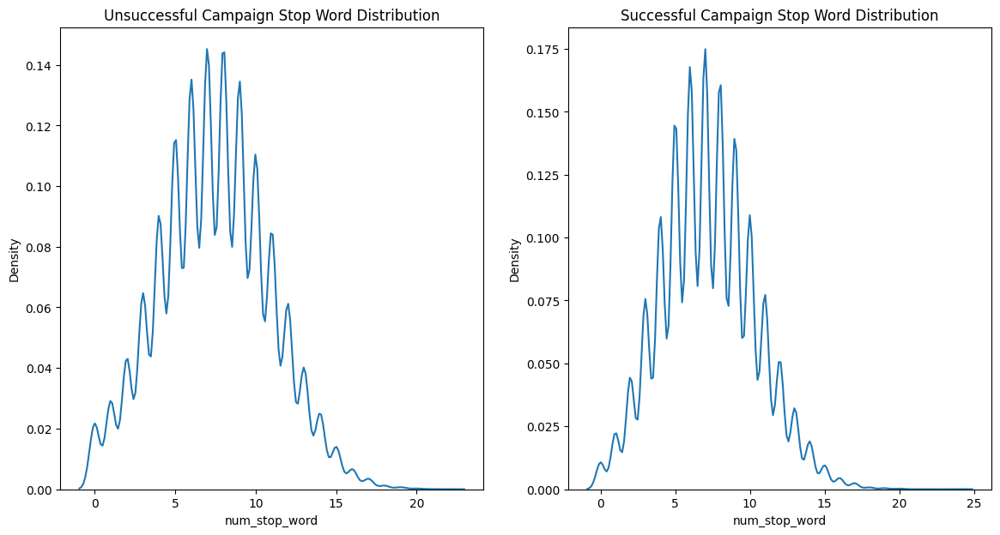

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize=(14,7))
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 0], x="num_stop_word", ax = axs[0])
axs[0].set_title("Unsuccessful Campaign Stop Word Distribution")
sns.kdeplot(data=kickstarter_data[kickstarter_data.state == 1], x="num_stop_word", ax = axs[1])
axs[1].set_title("Successful Campaign Stop Word Distribution")

#####1.8 Unigram Analysis

In [ ]:
most_freq_word_state_0 = top_word_cnt(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -11)
most_freq_word_state_1 = top_word_cnt(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -11)

Text(0.5, 1.0, 'High Freq Words for Successful Campaign')

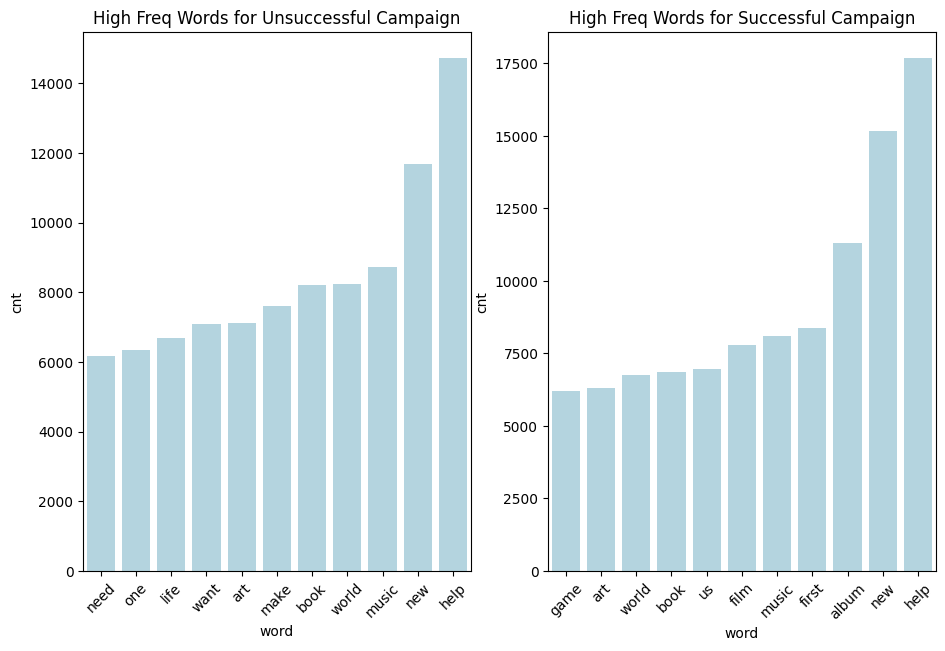

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(11,7))
sns.barplot(x = most_freq_word_state_0["word"], y = most_freq_word_state_0["cnt"],ax= axs[0], color= "lightblue")
axs[0].tick_params(axis='x', labelrotation=45)
axs[0].set_title("High Freq Words for Unsuccessful Campaign")

sns.barplot(x= most_freq_word_state_1["word"], y= most_freq_word_state_1["cnt"], ax= axs[1], color= "lightblue")
axs[1].tick_params(axis='x', labelrotation=45)
axs[1].set_title("High Freq Words for Successful Campaign")

#####1.8 Bigram Analysis

In [ ]:
most_freq_word_bigram = top_word_cnt(kickstarter_data["lowercampaign_text"], -11, (2, 2))
least_freq_word_bigram = top_word_cnt(kickstarter_data["lowercampaign_text"], 11, (2, 2))

Text(0.5, 1.0, 'Low Freq Bigram Words')

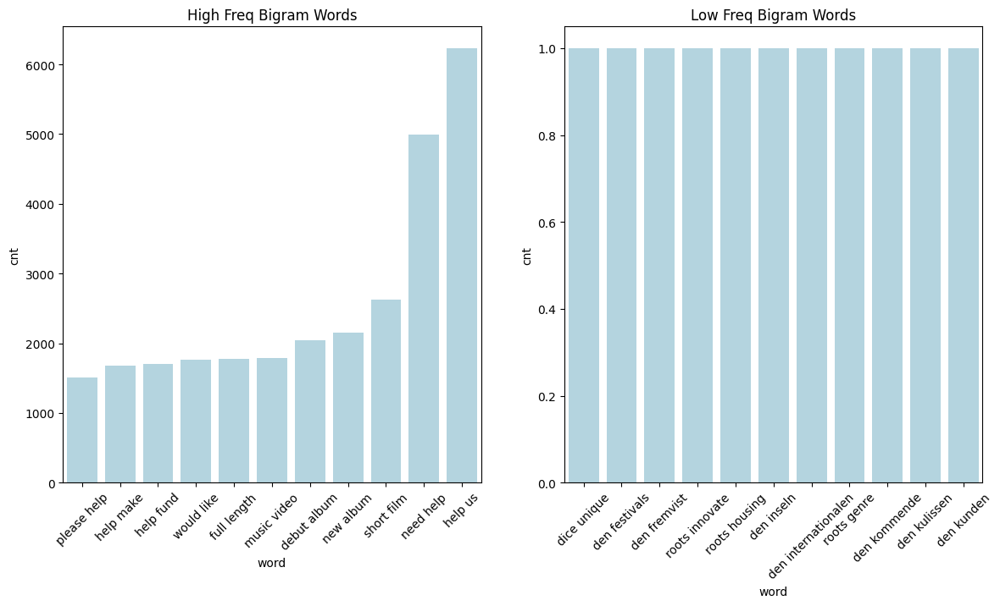

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(14,7))
sns.barplot(x = most_freq_word_bigram["word"], y = most_freq_word_bigram["cnt"],ax= axs[0], color= "lightblue")
axs[0].tick_params(axis='x', labelrotation=45)
axs[0].set_title("High Freq Bigram Words")

sns.barplot(x= least_freq_word_bigram["word"], y= least_freq_word_bigram["cnt"], ax= axs[1], color= "lightblue")
axs[1].tick_params(axis='x', labelrotation=45)
axs[1].set_title("Low Freq Bigram Words")

In [ ]:
most_freq_word_state_0_bigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -11, (2, 2))
most_freq_word_state_1_bigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -11, (2, 2))

Text(0.5, 1.0, 'High Freq Bigram Words for Successful Campaign')

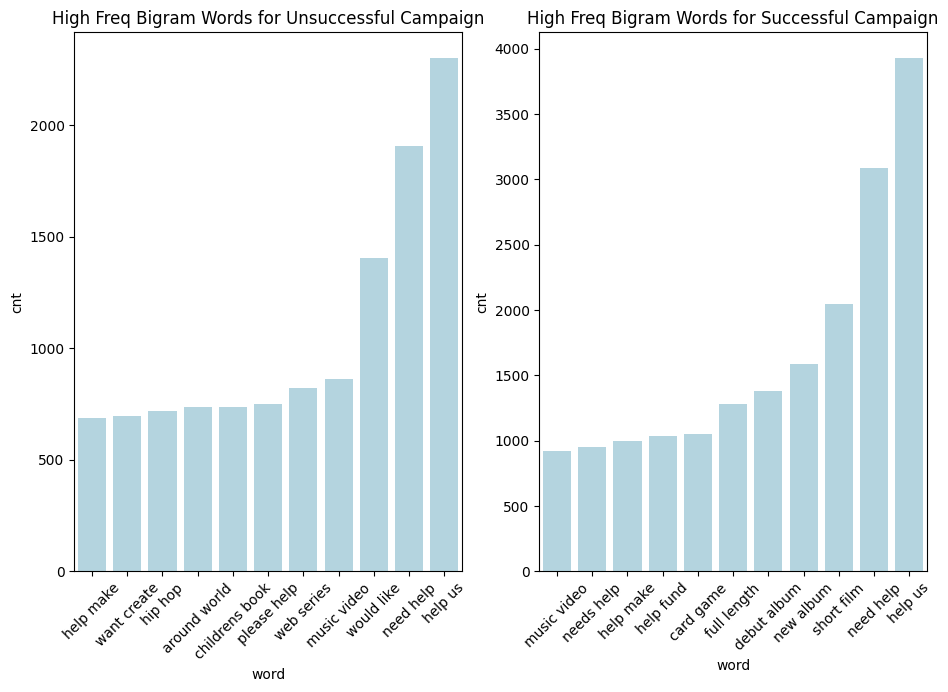

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(11,7))
sns.barplot(x = most_freq_word_state_0_bigram["word"], y = most_freq_word_state_0_bigram["cnt"],ax= axs[0], color= "lightblue")
axs[0].tick_params(axis='x', labelrotation=45)
axs[0].set_title("High Freq Bigram Words for Unsuccessful Campaign")

sns.barplot(x= most_freq_word_state_1_bigram["word"], y= most_freq_word_state_1_bigram["cnt"], ax= axs[1], color= "lightblue")
axs[1].tick_params(axis='x', labelrotation=45)
axs[1].set_title("High Freq Bigram Words for Successful Campaign")

#####1.8 Trigram Analysis

In [ ]:
most_freq_word_state_0_trigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -11, (3, 3))
most_freq_word_state_1_trigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -11, (3, 3))

Text(0.5, 1.0, 'High Freq Bigram Words for Successful Campaign')

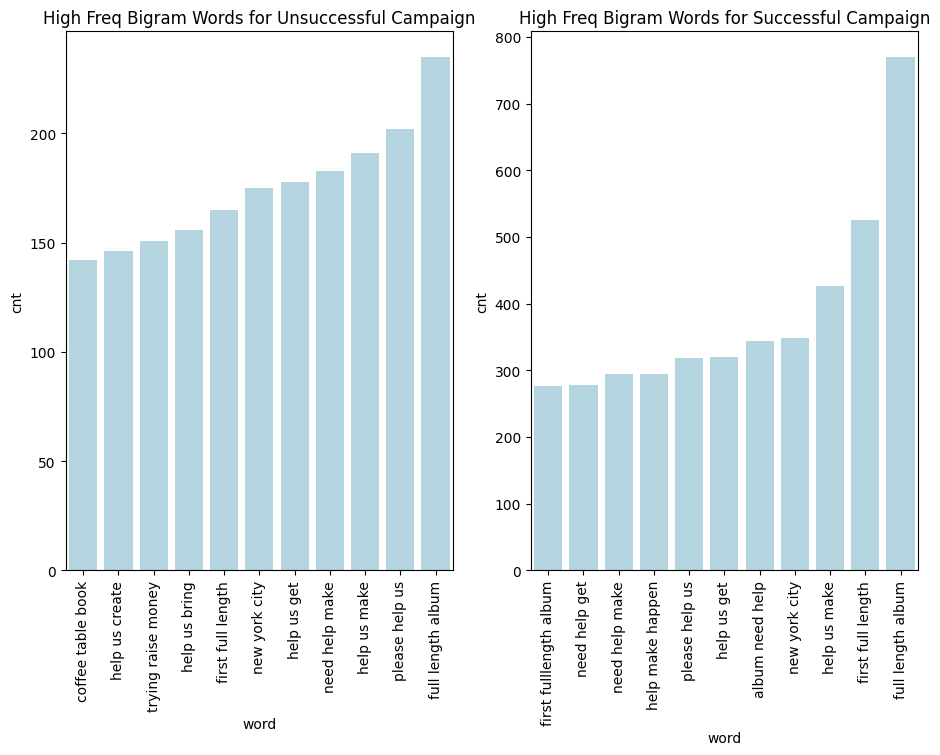

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(11,7))
sns.barplot(x = most_freq_word_state_0_trigram["word"], y = most_freq_word_state_0_trigram["cnt"],ax= axs[0], color= "lightblue")
axs[0].tick_params(axis='x', labelrotation=90)
axs[0].set_title("High Freq Bigram Words for Unsuccessful Campaign")

sns.barplot(x= most_freq_word_state_1_trigram["word"], y= most_freq_word_state_1_trigram["cnt"], ax= axs[1], color= "lightblue")
axs[1].tick_params(axis='x', labelrotation=90)
axs[1].set_title("High Freq Bigram Words for Successful Campaign")

#####1.8 TFIDF Unigram Analysis

In [ ]:
most_tfidf_word_state_0 = top_word_tfidf(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -11)
most_tfidf_word_state_1 = top_word_tfidf(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -11)

Text(0.5, 1.0, 'High TfIDf Words for Successful Campaign')

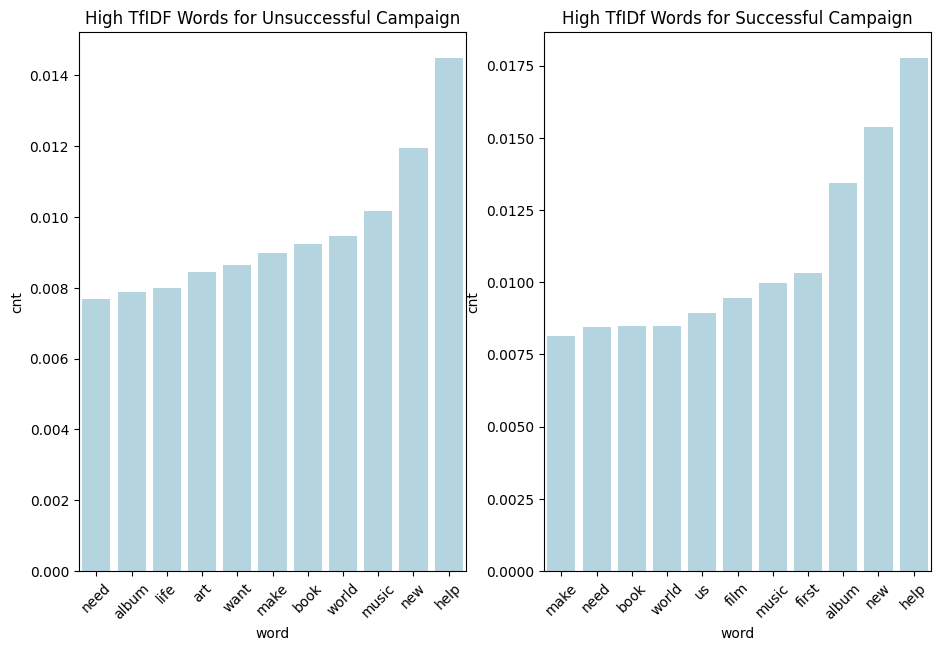

In [ ]:
fig, axs = plt.subplots(nrows = 1, ncols = 2, figsize=(11,7))
sns.barplot(x = most_tfidf_word_state_0["word"], y = most_tfidf_word_state_0["cnt"],ax= axs[0], color= "lightblue")
axs[0].tick_params(axis='x', labelrotation=45)
axs[0].set_title("High TfIDF Words for Unsuccessful Campaign")

sns.barplot(x= most_tfidf_word_state_1["word"], y= most_tfidf_word_state_1["cnt"], ax= axs[1], color= "lightblue")
axs[1].tick_params(axis='x', labelrotation=45)
axs[1].set_title("High TfIDf Words for Successful Campaign")

#####1.9 NetworkX Bigram Analysis

In [ ]:
most_tfidf_word_state_0_bigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"], -100, (2, 2))
most_tfidf_word_state_1_bigram = top_word_cnt(kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"], -100, (2, 2))

In [ ]:
most_tfidf_word_state_0_bigram[['word1', 'word2']] = most_tfidf_word_state_0_bigram['word'].str.split(" ", expand=True)

In [ ]:
most_tfidf_word_state_1_bigram[['word1', 'word2']] = most_tfidf_word_state_1_bigram['word'].str.split(" ", expand=True)

In [ ]:
import networkx as nx

In [ ]:
def make_graph(df):
  G = nx.Graph()
  for index_,pair in df[['word1', 'word2']].iterrows():
    G.add_node(pair["word1"])
    G.add_node(pair["word2"])
    G.add_edge(pair["word1"],pair["word2"])
  return G

def draw_graph(G, ax):
  pos  = nx.spring_layout(G, k =0.3, seed = 42)
  options = {
    "font_size": 9,
    "node_size": 7,
    "node_color": "white",
    "edgecolors": "black",
    "linewidths": 1,
    "width": 0.4
    }
  nx.draw(G, pos,with_labels= True, ax = ax, **options)

In [ ]:
G_state_0 = make_graph(most_tfidf_word_state_0_bigram[['word1', 'word2']])
G_state_1 = make_graph(most_tfidf_word_state_1_bigram[['word1', 'word2']])

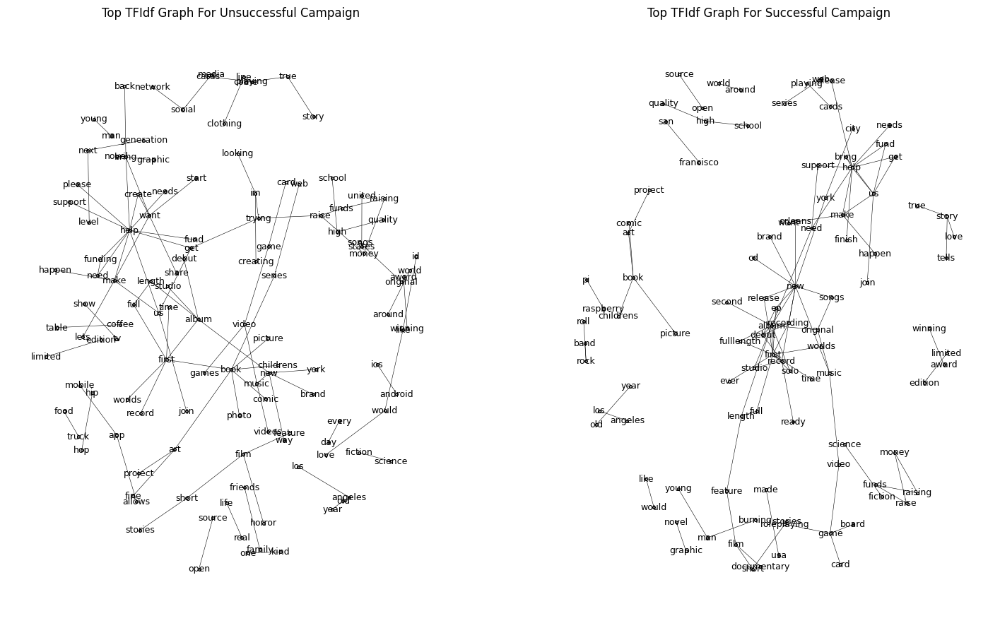

In [ ]:
fig, axs = plt.subplots(nrows = 1,ncols = 2, figsize=(18, 11))
draw_graph(G_state_0, axs[0])
axs[0].set_title("Top TFIdf Graph For Unsuccessful Campaign")
draw_graph(G_state_1, axs[1])
axs[1].set_title("Top TFIdf Graph For Successful Campaign")
plt.show()

####Topic Modeling using Bert

In [ ]:
!pip install bertopic

In [ ]:
kickstarter_text = kickstarter_data["lowercampaign_text"]

In [ ]:
from nltk.tokenize import sent_tokenize, word_tokenize
sentences = [sent_tokenize(ktext) for ktext in kickstarter_text.sample(10000)]
sentences = [sentence for doc in sentences for sentence in doc]

In [ ]:
sentences[:5]

['watch the stories unfold as hall of fame allstar  world champion former professional athletes share their personal stories',
 'a limited edition colored vinyl release of our new 5song ep fractals which was released digitally on february 1 2011',
 'in 1867 montana a young mercenary leads a potentially innocent man into the wilderness to dig his own grave',
 'dead like us is a low budget independent feature length horror film project',
 'control everything from your smartwatch tv cable tivo receiver camera fan ac and more universal learning remote']

#####Step 1: Precalculate Embedding

In [ ]:
from sentence_transformers import SentenceTransformer

# Pre-calculate embeddings
embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
embeddings = embedding_model.encode(sentences, show_progress_bar=True)

Batches:   0%|          | 0/313 [00:00<?, ?it/s]

#####Step 2: Dimensionality Reduction

In [ ]:
from umap import UMAP

umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)

#####Step 3: Clustering / Deciding on Number of Topics

In [ ]:
from hdbscan import HDBSCAN

hdbscan_model = HDBSCAN(min_cluster_size=150, metric='euclidean', cluster_selection_method='eom', prediction_data=True)

##### Step 4: Get Word Importance

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer_model = CountVectorizer(stop_words="english", min_df=2, ngram_range=(1, 2))

#####Step 5: Representation Model

In [ ]:
from bertopic.representation import KeyBERTInspired
representation_model = KeyBERTInspired()

#PMI Experiment
#pmi_state_0, vv = pmi(kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"].sample(1000))
#m = np.array(pmi_state_0.mean(axis = 0)).flatten()
#index = np.argsort(pmi_state_0[3026])[-11:]
#vv[index]

#####Step 6: Training

In [ ]:
from bertopic import BERTopic

topic_model = BERTopic(

  # Pipeline models
  embedding_model=embedding_model,
  umap_model=umap_model,
  hdbscan_model=hdbscan_model,
  vectorizer_model=vectorizer_model,
  representation_model=representation_model,

  # Hyperparameters
  top_n_words=10,
  verbose=True
)

topics, probs = topic_model.fit_transform(sentences, embeddings)

2023-10-27 06:40:08,983 - BERTopic - Reduced dimensionality
2023-10-27 06:40:10,461 - BERTopic - Clustered reduced embeddings


In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,787,-1_playing cards_cards_deck_deck playing,"[playing cards, cards, deck, deck playing, car...",[tacoma places illustrated by tacoma artists ...
1,0,6315,0_novel_book_books_adventure,"[novel, book, books, adventure, short film, st...",[a selfpublished photography book by andrew mi...
2,1,2217,1_album_recorded_cd_recording,"[album, recorded, cd, recording, music video, ...",[im recording my new album with producer ed ca...
3,2,680,2_food truck_foods_food_recipes,"[food truck, foods, food, recipes, restaurant,...",[a food truck market highlighting sydneys new ...


In [ ]:
topic_model.get_topic(0, full=True)

{'Main': [('novel', 0.48874247),
  ('book', 0.44006908),
  ('books', 0.4316057),
  ('adventure', 0.42867893),
  ('short film', 0.4200431),
  ('stories', 0.36487702),
  ('film', 0.34982866),
  ('documentary', 0.33168557),
  ('series', 0.30474973),
  ('comedy', 0.29327896)]}

In [ ]:
topic_model.get_topic(1, full=True)

{'Main': [('album', 0.5570895),
  ('recorded', 0.48914352),
  ('cd', 0.48616695),
  ('recording', 0.4674393),
  ('music video', 0.4652304),
  ('songs', 0.44733655),
  ('released', 0.42581302),
  ('record', 0.41917247),
  ('song', 0.40935495),
  ('vinyl', 0.39771947)]}

In [ ]:
topic_model.get_topic(2, full=True)

{'Main': [('food truck', 0.6409322),
  ('foods', 0.6024925),
  ('food', 0.5936597),
  ('recipes', 0.50321746),
  ('restaurant', 0.47802165),
  ('kitchen', 0.44692028),
  ('cooking', 0.44217187),
  ('produce', 0.44031185),
  ('cafe', 0.43200004),
  ('farmers', 0.42051774)]}

In [ ]:
topic_model.visualize_hierarchy(custom_labels=True)

In [ ]:
reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(embeddings)

In [ ]:
topic_model.visualize_documents(sentences, reduced_embeddings=reduced_embeddings, custom_labels=True)

In [ ]:
%pip install langdetect

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 981.5/981.5 kB 5.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for langdetect: filename=langdetect-1.0.9-py3-none-any.whl size=993224 sha256=a7a5b81977a02aed7ab9d8630a44e5f6e975e78e7c1dc68cef0a4750fec05b31
  Stored in directory: /root/.cache/pip/wheels/95/03/7d/59ea870c70ce4e5a370638b5462a7711ab78fba2f655d05106
Successfully built langdetect


In [ ]:
from nltk.tokenize import sent_tokenize, word_tokenize
from sentence_transformers import SentenceTransformer
from umap import UMAP
from hdbscan import HDBSCAN
from sklearn.feature_extraction.text import CountVectorizer
from bertopic.representation import KeyBERTInspired
from bertopic import BERTopic
from langdetect import detect, LangDetectException


class TopicGeneration:

  def __init__(self, textlist, detect_lang = False):
    self.textlist = textlist
    print("Sentence Conversion ....")
    sentences  = []

    if detect_lang:
      for ktext in textlist:
        try:
          if detect(ktext) == 'en':
            sentences.append(sent_tokenize(ktext))
        except LangDetectException:
          pass
    else:
      sentences = [sent_tokenize(ktext) for ktext in textlist]


    self.sentences = [sentence for doc in sentences for sentence in doc]
    print("Embedding Creation ....")
    self.embedding_model = SentenceTransformer("all-MiniLM-L6-v2")
    self.embeddings = self.embedding_model.encode(self.sentences, show_progress_bar=False)
    self.reduced_embeddings = UMAP(n_neighbors=10, n_components=2, min_dist=0.0, metric='cosine').fit_transform(self.embeddings)
    print("Dimensionality Reduction ....")
    self.umap_model = UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=42)
    print("Cluster Creation ....")
    self.hdbscan_model = HDBSCAN(min_cluster_size=150, metric='euclidean', cluster_selection_method='eom', prediction_data=True)
    print("Word Importance ....")
    self.vectorizer_model = CountVectorizer(stop_words="english", min_df=2, ngram_range=(1, 2))
    print("KeyBERTInspired Creation ....")
    self.representation_model = KeyBERTInspired()
    print("Enable Topic Bert Model ....")
    self.topic_model = BERTopic(
      # Pipeline models
      embedding_model=self.embedding_model,
      umap_model=self.umap_model,
      hdbscan_model=self.hdbscan_model,
      vectorizer_model=self.vectorizer_model,
      representation_model=self.representation_model,
      # Hyperparameters
      top_n_words=10,
      verbose=True
    )

  def info(self):
    return self.topic_model.get_topic_info()

  def train(self):
    self.topics, self.probs = self.topic_model.fit_transform(self.sentences, self.embeddings)

  def get_topic(self, topic_num):
    return self.topic_model.get_topic(0, full=True)

  def visualize_hierarchy(self):
    self.topic_model.visualize_hierarchy(custom_labels=True)

  def visualize_documents(self):
    self.topic_model.visualize_documents(self.sentences, reduced_embeddings=self.reduced_embeddings, custom_labels=True)


In [ ]:
kickstarter_text = kickstarter_data[kickstarter_data.state == 0]["lowercampaign_text"]

In [ ]:
topic_handler_state_0 = TopicGeneration(kickstarter_text.sample(50000))

Sentence Conversion ....
Embedding Creation ....
Dimensionality Reduction ....
Cluster Creation ....
Word Importance ....
KeyBERTInspired Creation ....
Enable Topic Bert Model ....


In [ ]:
topic_handler_state_0.train()

2023-10-27 12:09:01,291 - BERTopic - Reduced dimensionality
2023-10-27 12:09:13,731 - BERTopic - Clustered reduced embeddings


In [ ]:
topic_handler_state_0.topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,777,-1_join party_party_contest_house,"[join party, party, contest, house, tour, brin...",[dorothy has entered our vota house party tour...
1,0,35584,0_app_books_games_novel,"[app, books, games, novel, art, creating, game...",[i want to make tutus for people of all sizesg...
2,1,8414,1_new album_recording_album_recorded,"[new album, recording, album, recorded, songs,...",[ready to record my 4th studio album featuring...
3,2,4302,2_food truck_foods_food_restaurant,"[food truck, foods, food, restaurant, catering...",[fastcausal gourmet deli coffee restaurant f...


In [ ]:
topic_handler_state_0.get_topic(0)

{'Main': [('app', 0.37030923),
  ('books', 0.36989418),
  ('games', 0.36898983),
  ('novel', 0.36758623),
  ('art', 0.3591907),
  ('creating', 0.35911602),
  ('game', 0.3586223),
  ('adventure', 0.34846807),
  ('create', 0.34514102),
  ('book', 0.345006)]}

In [ ]:
topic_handler_state_0.get_topic(1)

{'Main': [('app', 0.37030923),
  ('books', 0.36989418),
  ('games', 0.36898983),
  ('novel', 0.36758623),
  ('art', 0.3591907),
  ('creating', 0.35911602),
  ('game', 0.3586223),
  ('adventure', 0.34846807),
  ('create', 0.34514102),
  ('book', 0.345006)]}

In [ ]:
topic_handler_state_0.get_topic(2)

{'Main': [('app', 0.37030923),
  ('books', 0.36989418),
  ('games', 0.36898983),
  ('novel', 0.36758623),
  ('art', 0.3591907),
  ('creating', 0.35911602),
  ('game', 0.3586223),
  ('adventure', 0.34846807),
  ('create', 0.34514102),
  ('book', 0.345006)]}

In [ ]:
kickstarter_text = kickstarter_data[kickstarter_data.state == 1]["lowercampaign_text"]

In [ ]:
topic_handler_state_1 = TopicGeneration(kickstarter_text.sample(50000))

Sentence Conversion ....
Embedding Creation ....
Dimensionality Reduction ....
Cluster Creation ....
Word Importance ....
KeyBERTInspired Creation ....
Enable Topic Bert Model ....


In [ ]:
topic_handler_state_1.train()

2023-10-27 12:30:37,213 - BERTopic - Reduced dimensionality
2023-10-27 12:30:50,807 - BERTopic - Clustered reduced embeddings


In [ ]:
topic_handler_state_1.topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,19083,-1_film_illustrated_art_documentary,"[film, illustrated, art, documentary, books, a...",[video games the movie is the first ever in de...
1,0,14207,0_album need_studio album_new album_debut album,"[album need, studio album, new album, debut al...",[grammynominated singersongwriter anousheh is ...
2,1,5214,1_short film_film_films_movie,"[short film, film, films, movie, filmmakers, f...",[with your help were taking our short film hi ...
3,2,2055,2_craft beer_food truck_brew_brewing,"[craft beer, food truck, brew, brewing, beer, ...",[help ground breaker brewing put their delicio...
4,3,1783,3_wallet_wallets_pocket_sleek,"[wallet, wallets, pocket, sleek, card, leather...",[super thin leather wallet that adapts to your...
5,4,1513,4_art gallery_paintings_artwork_artworks,"[art gallery, paintings, artwork, artworks, ar...",[art fence is an oversized outdoor gallery tha...
6,5,1239,5_card game_adventure game_cards_board game,"[card game, adventure game, cards, board game,...",[cockfight is a card game for 24 players with ...
7,6,591,6_clothing brand_clothing accessories_apparel_...,"[clothing brand, clothing accessories, apparel...",[wearable beautiful moveinitable ecofriendly c...
8,7,555,7_children book_childrens books_childrens book...,"[children book, childrens books, childrens boo...",[theodore the thoughtful is an illustrated chi...
9,8,428,8_comic book_comic series_comics_comic artists,"[comic book, comic series, comics, comic artis...",[kotw issue 2 kickstarter to fund the coloring...


In [ ]:
topic_handler_state_1.topic_model.visualize_documents(topic_handler_state_1.sentences, reduced_embeddings=topic_handler_state_1.reduced_embeddings, custom_labels=True)

####Logisitic Regression Predictive Model using Embedding Features

###### Step 1: Data Preparation

In [ ]:
state_0_embedding = pd.DataFrame(topic_handler_state_0.embeddings)

In [ ]:
state_0_embedding["state"] = 0

In [ ]:
state_1_embedding = pd.DataFrame(topic_handler_state_1.embeddings)

In [ ]:
state_1_embedding["state"] = 1

In [ ]:
kickstart_data_use = pd.concat([state_0_embedding, state_1_embedding],axis=0)

In [ ]:
# Shuffle Data
kickstart_data_use = kickstart_data_use.sample(frac = 1)

##### Step 2: Data Budget

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    kickstart_data_use.drop(columns="state"),
    kickstart_data_use["state"],
    random_state=2023,
    test_size=0.1
)

##### Step 3: Grid Search

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

logreg_parameters = {
  'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100, 1000], # Lets try bigger combination
  'classifier__penalty': [None,"l2"]
}

pipe_logreg = Pipeline([
    ('classifier', LogisticRegression(random_state=2023))
])

grid = GridSearchCV(pipe_logreg, logreg_parameters, cv=10).fit(X_train, y_train)

#####Step 4: Extract Best Hyperparameters

In [ ]:
best_params_ = grid.best_params_
best_classifer_ = grid.best_estimator_
print(f"Best Classifier {best_classifer_}")

Best Classifier Pipeline(steps=[('classifier', LogisticRegression(C=100, random_state=2023))])


In [ ]:
pd.DataFrame.from_dict(grid.cv_results_, orient='columns')

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_classifier__C,param_classifier__penalty,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,8.442684,1.421508,0.032182,0.013080,0.001,None,"{'classifier__C': 0.001, 'classifier__penalty'...",0.645561,0.654461,0.656264,0.649955,0.657278,0.659982,0.655250,0.652958,0.653070,0.661859,0.654664,0.004476,4
1,1.170131,0.198021,0.033868,0.012122,0.001,l2,"{'classifier__C': 0.001, 'classifier__penalty'...",0.614015,0.623254,0.624831,0.615480,0.625056,0.626070,0.619648,0.620282,0.624113,0.626817,0.621957,0.004218,14
2,6.970963,1.553884,0.031080,0.022824,0.01,None,"{'classifier__C': 0.01, 'classifier__penalty':...",0.645561,0.654461,0.656264,0.649955,0.657278,0.659982,0.655250,0.652958,0.653070,0.661859,0.654664,0.004476,4
3,1.533391,0.286505,0.022580,0.010223,0.01,l2,"{'classifier__C': 0.01, 'classifier__penalty':...",0.634520,0.639365,0.641731,0.634069,0.642181,0.646124,0.637111,0.644958,0.638423,0.643155,0.640164,0.003949,13
4,7.403469,1.755224,0.027163,0.016310,0.1,None,"{'classifier__C': 0.1, 'classifier__penalty': ...",0.645561,0.654461,0.656264,0.649955,0.657278,0.659982,0.655250,0.652958,0.653070,0.661859,0.654664,0.004476,4
5,4.146738,0.763180,0.022670,0.007792,0.1,l2,"{'classifier__C': 0.1, 'classifier__penalty': ...",0.644660,0.650293,0.656489,0.644209,0.654011,0.657165,0.647589,0.652282,0.652620,0.654423,0.651374,0.004362,12
6,6.474621,0.846957,0.022929,0.007040,1,None,"{'classifier__C': 1, 'classifier__penalty': None}",0.645561,0.654461,0.656264,0.649955,0.657278,0.659982,0.655250,0.652958,0.653070,0.661859,0.654664,0.004476,4
7,6.228253,0.847997,0.023549,0.008346,1,l2,"{'classifier__C': 1, 'classifier__penalty': 'l2'}",0.645223,0.653447,0.658517,0.649392,0.657503,0.660095,0.654799,0.653859,0.654648,0.661183,0.654867,0.004621,2
8,6.637487,1.000735,0.026603,0.011919,10,None,"{'classifier__C': 10, 'classifier__penalty': N...",0.645561,0.654461,0.656264,0.649955,0.657278,0.659982,0.655250,0.652958,0.653070,0.661859,0.654664,0.004476,4
9,6.284003,0.762561,0.021465,0.007456,10,l2,"{'classifier__C': 10, 'classifier__penalty': '...",0.645223,0.655025,0.656377,0.650180,0.657278,0.659306,0.654912,0.654310,0.652845,0.662310,0.654777,0.004500,3


#####Step 5: Retraining Best Model

In [ ]:
best_classifer_.fit(X_train, y_train)

Pipeline(steps=[('classifier', LogisticRegression(C=100, random_state=2023))])

#####Step 6: Measuring Model Performance

In [ ]:
best_classifer_.score(X_test, y_test)

0.6481443926181302

In [ ]:
auc_metric(best_classifer_, X_test, y_test)

0.7018349169073472

####Bert Transformer Model for Classification



In [ ]:
%pip install torch
%pip install transformers
%pip install transformers[torch]
%pip install datasets
%pip install bertviz

In [ ]:
%pip install langdetect

In [16]:
from langdetect import detect, LangDetectException

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [18]:
from datasets import Dataset
from datasets.features.features import ClassLabel

In [66]:
import torch
from transformers import AutoTokenizer, AutoConfig, AutoModelForSequenceClassification, DataCollatorWithPadding
from transformers import Trainer, TrainingArguments
import datasets
from datasets import DatasetDict
from transformers import pipeline
from typing import List
import pandas as pd
import numpy as np
from torch.nn.functional import cross_entropy

######Step 1: Load Datase for Classification

In [67]:
import csv
blurb = []
state = []
created_at = []
with open('/content/kickstarter.csv', newline='') as csvfile:
  kickstarter_reader = csv.reader(csvfile, delimiter=',', quotechar='"')
  for row in kickstarter_reader:
    blurb.append(row[0])
    state.append(row[1])
    created_at.append(row[2])
kickstarter_data = pd.DataFrame(data = {"blurb": blurb, "state": state, "created_at": created_at})
kickstarter_data = kickstarter_data.drop([0])
kickstarter_data["state"] = kickstarter_data["state"].astype(int)

In [68]:
kickstarter_data.head()

,blurb,state,created_at
1,Exploring paint and its place in a digital world.,0,2015-03-17
2,Mike Fassio wants a side-by-side photo of me a...,0,2014-07-11
3,I need your help to get a nice graphics tablet...,0,2014-07-30
4,I want to create a Nature Photograph Series of...,0,2015-05-08
5,I want to bring colour to the world in my own ...,0,2015-02-01


In [69]:
kickstarter_data = kickstarter_data[kickstarter_data["blurb"].apply(lambda x : len(x) > 20)]

In [70]:
len(kickstarter_data)

269036

In [71]:
def lang_detect_func(ktext):
  try:
    if detect(ktext) == 'en':
      return True
  except LangDetectException:
      pass
  return False

#kickstarter_data = kickstarter_data[kickstarter_data["blurb"].apply(lang_detect_func)]

In [72]:
#kickstarter_data["state"] = kickstarter_data["state"].astype(str).apply(lambda x : "Success" if x == "1" else "Unsuccessful")

######Step 2: Convert Data into Transformer Style format

In [73]:
_ds = Dataset.from_dict(
            dict(
            text=kickstarter_data["blurb"],
            label=kickstarter_data["state"]
            )
        )

In [74]:
kickstarter_ds = _ds.train_test_split(test_size=0.1)

In [75]:
kickstarter_ds

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 242132
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 26904
    })
})

In [76]:
model_name = "roberta-base"
model_ckpt = from_pretrained_str = "roberta-base"
max_len = 160
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
batch_size = 64
num_train_epochs = 2
num_labels = 2
features = ['text', 'label']
input_ = features[0] # expect text
label_ = features[1] # expect label

######Step 3: Loading Tokenizer and PreTrained Model

In [77]:
output_dir = f"{model_ckpt}-finetuned-classifier"

In [ ]:
_tokenizer = AutoTokenizer.from_pretrained(from_pretrained_str, max_len = max_len)

In [ ]:
_model =  AutoModelForSequenceClassification.from_pretrained(model_ckpt, num_labels = num_labels).to(device)

In [80]:
#_model.config.id2label = {i: l for i, l in enumerate(["0", "1"])}

In [81]:
training_args = TrainingArguments(output_dir=output_dir,
                                  overwrite_output_dir=True,
                                  num_train_epochs=num_train_epochs,
                                  load_best_model_at_end = True,
                                  learning_rate=2e-5,
                                  per_device_train_batch_size=batch_size,
                                  per_device_eval_batch_size=batch_size,
                                  weight_decay=0.01,
                                  evaluation_strategy="epoch",
                                  save_strategy = 'epoch',
                                  eval_steps = 50,
                                  disable_tqdm=False,
                                  push_to_hub=False,
                                  log_level="info")

Found safetensors installation, but --save_safetensors=False. Safetensors should be a preferred weights saving format due to security and performance reasons. If your model cannot be saved by safetensors please feel free to open an issue at https://github.com/huggingface/safetensors!
PyTorch: setting up devices
The default value for the training argument `--report_to` will change in v5 (from all installed integrations to none). In v5, you will need to use `--report_to all` to get the same behavior as now. You should start updating your code and make this info disappear :-).


In [82]:
def _tokenize(batch):
  return _tokenizer(batch[input_], padding=True, truncation=True)
kickstarter_ds_encoded = kickstarter_ds.map(_tokenize, batched = True)

Map:   0%|          | 0/242132 [00:00<?, ? examples/s]

Map:   0%|          | 0/26904 [00:00<?, ? examples/s]

In [83]:
kickstarter_ds_encoded

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 242132
    })
    test: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 26904
    })
})

In [84]:
kickstarter_ds_encoded.set_format("torch",
                      columns=["input_ids", "attention_mask", label_])

######Step 4: Setting Evaluation Metrics

In [85]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, roc_auc_score

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(-1)
    f1 = f1_score(labels, preds, average="weighted")
    acc = accuracy_score(labels, preds)
    prec = precision_score(labels, preds, average="weighted")
    recall = recall_score(labels, preds, average="weighted")

    return {"accuracy": acc, "f1": f1, "prec": prec, "recall": recall}

######Step 5: Fine-tuning the Model

In [86]:
trainer = Trainer(model=_model,
                  args=training_args,
                  data_collator=DataCollatorWithPadding(_tokenizer),
                  compute_metrics=compute_metrics,
                  train_dataset=kickstarter_ds_encoded["train"],
                  eval_dataset=kickstarter_ds_encoded["validation"] if "validation" in kickstarter_ds_encoded else kickstarter_ds_encoded["test"],
                  tokenizer=_tokenizer
)

In [87]:
trainer.train()

The following columns in the training set don't have a corresponding argument in `RobertaForSequenceClassification.forward` and have been ignored: text. If text are not expected by `RobertaForSequenceClassification.forward`,  you can safely ignore this message.
***** Running training *****
  Num examples = 242,132
  Num Epochs = 2
  Instantaneous batch size per device = 64
  Total train batch size (w. parallel, distributed & accumulation) = 64
  Gradient Accumulation steps = 1
  Total optimization steps = 7,568
  Number of trainable parameters = 124,647,170
You're using a RobertaTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


Epoch,Training Loss,Validation Loss,Accuracy,F1,Prec,Recall
1,0.511900,0.498138,0.753234,0.753249,0.756644,0.753234


The following columns in the evaluation set don't have a corresponding argument in `RobertaForSequenceClassification.forward` and have been ignored: text. If text are not expected by `RobertaForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 26904
  Batch size = 64
Saving model checkpoint to roberta-base-finetuned-classifier/checkpoint-3784
Configuration saved in roberta-base-finetuned-classifier/checkpoint-3784/config.json
Model weights saved in roberta-base-finetuned-classifier/checkpoint-3784/pytorch_model.bin
tokenizer config file saved in roberta-base-finetuned-classifier/checkpoint-3784/tokenizer_config.json
Special tokens file saved in roberta-base-finetuned-classifier/checkpoint-3784/special_tokens_map.json


Epoch,Training Loss,Validation Loss,Accuracy,F1,Prec,Recall
1,0.511900,0.498138,0.753234,0.753249,0.756644,0.753234
2,0.436400,0.471925,0.774532,0.774085,0.782436,0.774532


The following columns in the evaluation set don't have a corresponding argument in `RobertaForSequenceClassification.forward` and have been ignored: text. If text are not expected by `RobertaForSequenceClassification.forward`,  you can safely ignore this message.
***** Running Evaluation *****
  Num examples = 26904
  Batch size = 64
Saving model checkpoint to roberta-base-finetuned-classifier/checkpoint-7568
Configuration saved in roberta-base-finetuned-classifier/checkpoint-7568/config.json
Model weights saved in roberta-base-finetuned-classifier/checkpoint-7568/pytorch_model.bin
tokenizer config file saved in roberta-base-finetuned-classifier/checkpoint-7568/tokenizer_config.json
Special tokens file saved in roberta-base-finetuned-classifier/checkpoint-7568/special_tokens_map.json


Training completed. Do not forget to share your model on huggingface.co/models =)


Loading best model from roberta-base-finetuned-classifier/checkpoint-7568 (score: 0.47192513942718506).


TrainOutput(global_step=7568, training_loss=0.49785015018495393, metrics={'train_runtime': 10810.8401, 'train_samples_per_second': 44.794, 'train_steps_per_second': 0.7, 'total_flos': 3.380474272593648e+16, 'train_loss': 0.49785015018495393, 'epoch': 2.0})